## 1. Intensity window-based correlation

The functions perform intensity based correlation as follows:

1. Extract patch of 51x51 size for intensity matching
2. Match the patch from one image with other image using OpenCV's matchtemplate(). The function finds correlation using squared-norm method.
3. Draw the obtained matches on the concatenated image

In [3]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import math
import matplotlib
import random
matplotlib.rcParams['figure.figsize'] = (20.0, 20.0)

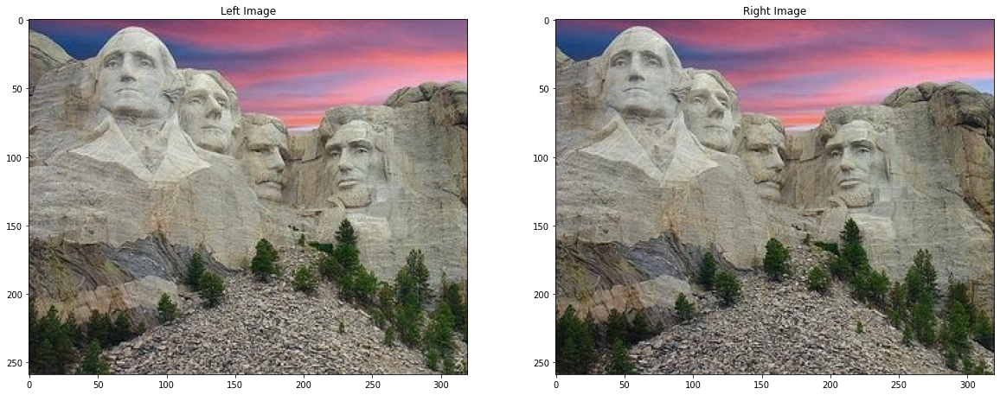

In [26]:
img2 = cv2.cvtColor( cv2.imread('../images/Stereo Correspondence/1_1.jpg') , cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg') ,cv2.COLOR_BGR2RGB )

pix , a = plt.subplots(1,2)

a[0].imshow(img1)
a[0].set_title('Left Image')

a[1].imshow(img2)
a[1].set_title('Right Image')
print()

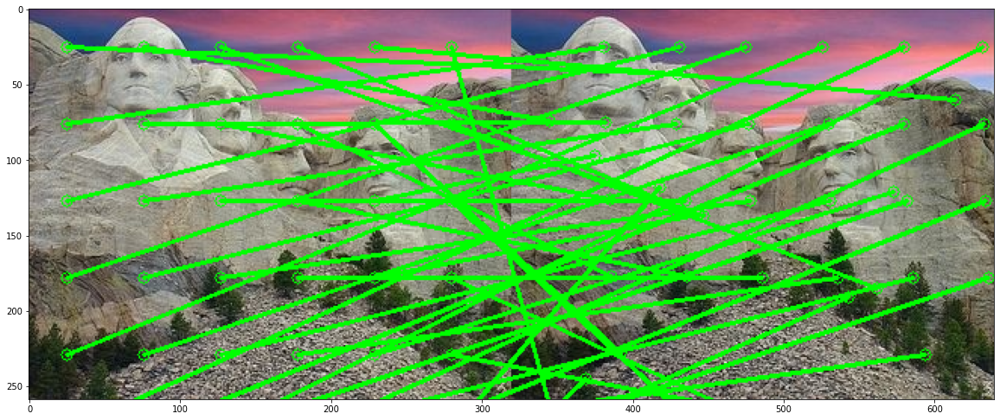

In [27]:
def get_match_point(img , patch , window , method ,h,w ,i,j):
    
    res = cv2.matchTemplate(img, patch, method)

    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    
    mid1 = (max_loc[0] + window//2+w//2, max_loc[1] + window//2)
    mid2 = (i + window//2, j + window//2)
    
    return mid1 ,mid2


def match_img( img1 , img2 ,window ):
    final = np.concatenate((img1 ,img2) ,axis=1)
    
    pts1 = []
    pts2 = []
    
    for i in range( 0 , img1.shape[0] , window):
        for j in range( 0 , img2.shape[1] ,window):
            
            patch = img1[i:i + window, j:j + window]
            
            center1 ,center2 = get_match_point(img2, patch, window, cv2.TM_CCORR_NORMED ,final.shape[0] ,final.shape[1] ,i,j)
            
            cv2.circle( final ,center1 ,4, (0, 255, 0),thickness=1,lineType=8,shift=0)
            cv2.circle( final ,center2 ,4, (0, 255, 0),thickness=1,lineType=8,shift=0)
            cv2.line( final, center1, center2, (0, 255, 0), 2)
            
    return final

op = match_img(img1 ,img2 , 51)

plt.imshow(op)

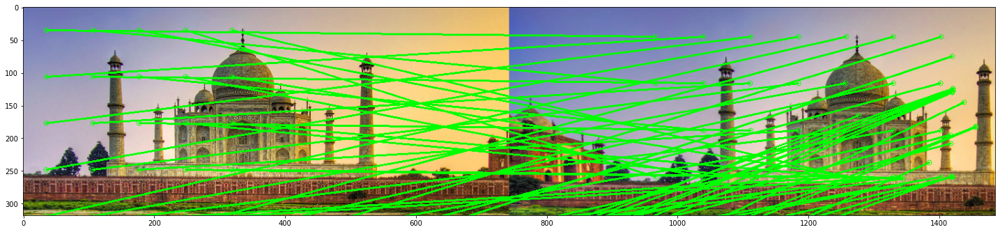

In [28]:
img2 = cv2.cvtColor( cv2.imread('../images/Stereo Correspondence/2_1.png') , cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_2.png') ,cv2.COLOR_BGR2RGB )

img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op = match_img(img1 ,img2 , 71)

plt.figure( figsize=(25,25))
plt.imshow(op)

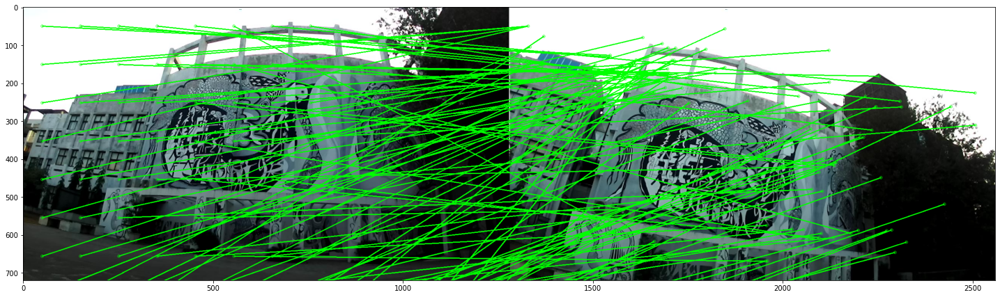

In [29]:
img2 = cv2.cvtColor( cv2.imread('../images/Stereo Correspondence/3_1.jpg') , cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_2.jpg') ,cv2.COLOR_BGR2RGB )

img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op = match_img(img1 ,img2 , 101)

plt.figure( figsize=(25,25))
plt.imshow(op)

## 2. Ploting Epipolar Lines 

Process of Poltting Epipolar Lines Is as Below 

1. Get corresponding feature points from both images using SIFT Feature descriptor 
2. Estimate Fundamental Matrix Using 8 point algorithm 
3. Calculate epipolar lines equations passing through the Selected points 
4. Plot the epipolar lines corresponding to the points in other image 

AF = 0 = \begin{bmatrix}
x_1x_1' \quad x_1y_1' \quad x_1 \quad y_1x_1' \quad y_1y_1' \quad y_1 \quad x_1' \quad y_1' \quad 1 \\
   . \\
   . \\
   . \\
x_Mx_M' \quad x_My_M' \quad x_M \quad y_Mx_M' \quad y_My_M' \quad y_M \quad x_M' \quad y_M' \quad 1 \\
\end{bmatrix} 

\begin{bmatrix}
f_1 \\ f_2 \\ f_2 \\ f_3 \\ f_4 \\ f_5 \\ f_6 \\ f_7 \\ f_8 \\ f_9 \\
\end{bmatrix} 


<ol>
<li>U,D,V = SVD(A) </li><br>

<li> Element of V corrusponding to the samllest singular value of D will be the solution of the F, which is last element of V</li> <br>

<li> Due to Noise , F may not be 2 rank matrix. So enforce it to be rank 2 matrix 
   
   * U ,D ,V = SVD( F )
   * D' = \begin{bmatrix}
          D_1 \quad D_2 \quad D_3 \\
          D_4 \quad D_5 \quad D_6 \\
          D_7 \quad D_8 \quad 0 \\
         \end{bmatrix}
   * F = U D' V </li>
    
</ol>

In [30]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)


def get_feature_points( img1 ,img2 ):

    gray1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2 , cv2.COLOR_BGR2GRAY)

    sift = cv2.xfeatures2d.SIFT_create()

    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    index_params = dict(algorithm=0, trees=5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1, des2, k=2)

    pts1_temp = []
    pts2_temp = []

    match_pts = []

    for i, (m, n) in enumerate(matches):
        if m.distance < 0.75*n.distance:
            pts2_temp.append(kp2[m.trainIdx].pt)
            pts1_temp.append(kp1[m.queryIdx].pt)

            match_pts.append(m)

    l = random.sample( range( len(match_pts)), k=20)
    final_pts = []

    pts1 = []
    pts2 = []

    for i in l:
        final_pts.append( match_pts[i])
        pts1.append( pts1_temp[i] )
        pts2.append( pts2_temp[i] )

    img3 = cv2.drawMatches(img1,kp1,img2,kp2,final_pts[:], None,flags=2)
    
    return pts1 ,pts2 ,img3

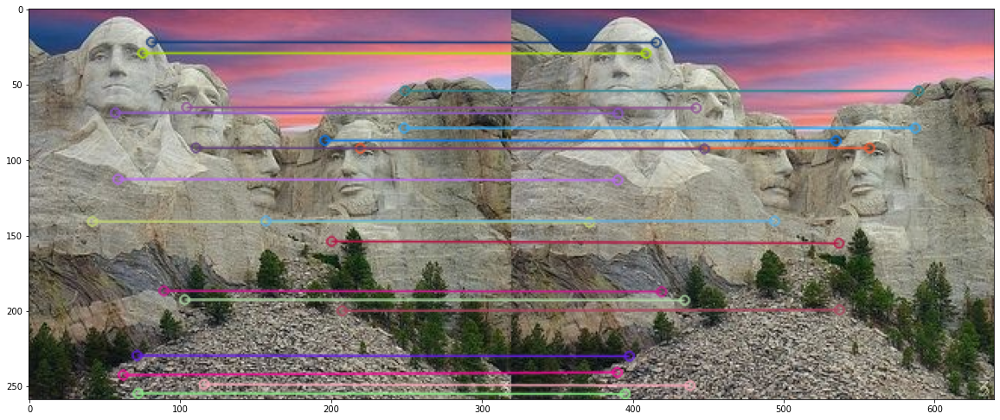

In [31]:
pts1 , pts2 , op = get_feature_points( img1 ,img2 )

plt.figure(figsize=(20,20))
plt.imshow(op)

In [32]:
def SVD(pts1,pts2):
    
    num_pts = pts1.shape[0]
    
    x1 , y1 = pts1[:,0] ,pts1[:,1]
    x2 , y2 = pts2[:,0] ,pts2[:,1] 
    
    A = np.column_stack((x1*x2, y1*x2, x2, x1*y2, y1*y2, y2, x1, y1, np.ones(num_pts)))
    U,S,V = np.linalg.svd(A, full_matrices=True)
    
    F = V.T[:,-1]
    F = F.reshape((3,3))


    U, S, V = np.linalg.svd(F)
    S[-1] = 0
    S = np.diag(S)
    F = np.dot(np.dot(U, S), V)

    return F


def get_lines(points,F ,flag):
    
    pts_homo = np.column_stack((points,np.ones(points.shape[0])))
    
    if flag==2:
        lines = np.dot(pts_homo,F)
    else:
        lines = np.dot(pts_homo,F.T)
    
    lines/=np.sqrt(((lines[:,0])**2 + (lines[:,1])**2)).reshape(-1,1)
    return lines


In [33]:
def estimate_F( pts1 ,pts2):
    
    m1 = np.mean(pts1,axis = 0)
    s1 = np.linalg.norm((pts1-m1))/len(pts1)

    m2 = np.mean(pts2, axis=0)
    s2 = np.linalg.norm((pts2 - m2)) / (len(pts2))


    s1 = np.sqrt(2)/s1
    s2 = np.sqrt(2)/s2


    norm1 = (pts1 - m1)* s1;
    norm2 = (pts2 - m2) * s2;

    denorm1 = np.asarray([ [s1 , 0  , -s1*m1[0] ],
                           [0  , s1 , -s1*m1[1] ],
                           [0  , 0  ,     1     ]], dtype = np.float32)

    denorm2 = np.asarray([ [s2 , 0  , -s2*m2[0]],
                           [0  , s2 , -s2*m2[1]],
                           [0  , 0  ,     1    ]], dtype = np.float32)

    norm1 = np.column_stack((norm1, np.ones(norm1.shape[0])))
    norm2 = np.column_stack((norm2, np.ones(norm2.shape[0])))
    
    Fundam = SVD(norm1, norm2)

    F = np.dot(denorm2.T, np.dot(Fundam, denorm1))
    return F
    


def epi_polar_lines(pts1, pts2 ,img1 ,img2):
    
    pts1 = np.array( pts1 )
    pts2 = np.array( pts2 )
    
    F = estimate_F(pts1 ,pts2)

    epline1 = get_lines(pts2, F, 2)
    epline2 = get_lines(pts1, F, 1)

    x_intercept = [0,1,0]
    y_intercept = [1,0,0]
    
    for i in range( len(epline1) ):
        
        line1, line2 = epline1[i], epline2[i]
        temp1,temp2 = pts1[i], pts2[i]

        color = tuple(np.random.randint(0,255,3).tolist())
        
        x1 = np.cross(line1, x_intercept)
        y1 = np.cross(line1, y_intercept)
        x1 = (x1[:2] / x1[2]).astype(int)
        y1 = (y1[:2] / y1[2]).astype(int)
        cv2.line(img1, tuple(x1[:2]), tuple(y1[:2]), color, thickness=2)
        cv2.circle(img1, tuple(map(int,temp1)), 4, color, -1)

        
        x1 = np.cross(line2, x_intercept)
        y1 = np.cross(line2, y_intercept)
        x1 = (x1[:2] / x1[2]).astype(int)
        y1 = (y1[:2] / y1[2]).astype(int)
        
        cv2.line(img2, tuple(x1[:2]), tuple(y1[:2]), color, thickness=2)
        cv2.circle(img2, tuple(map(int,temp2)), 4, color, -1)

    return img1 ,img2
    
    
    

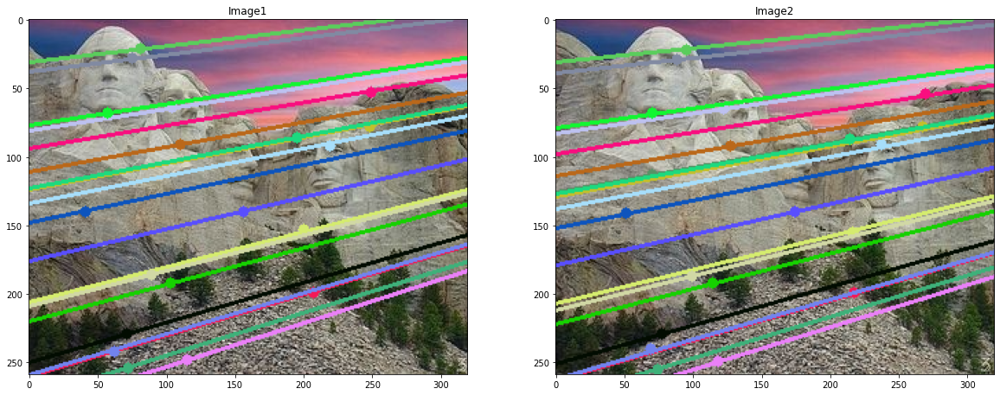

In [34]:
img1 , img2 = epi_polar_lines(pts1 ,pts2 , img1 ,img2)

pix , a = plt.subplots(1,2)

a[0].imshow(img1)
a[0].set_title('Image1')

a[1].imshow(img2)
a[1].set_title('Image2')
print()

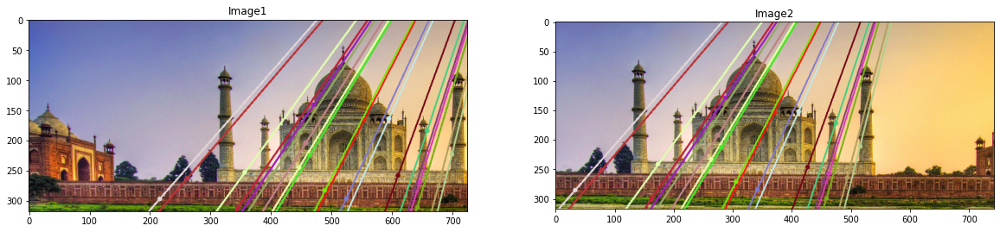

In [42]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_1.png') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_2.png'),cv2.COLOR_BGR2RGB)

pts1 , pts2 , op = get_feature_points( img1 ,img2 )
img1 , img2 = epi_polar_lines(pts1 ,pts2 , img1 ,img2)

pix , a = plt.subplots(1,2)

a[0].imshow(img1)
a[0].set_title('Image1')

a[1].imshow(img2)
a[1].set_title('Image2')
print()


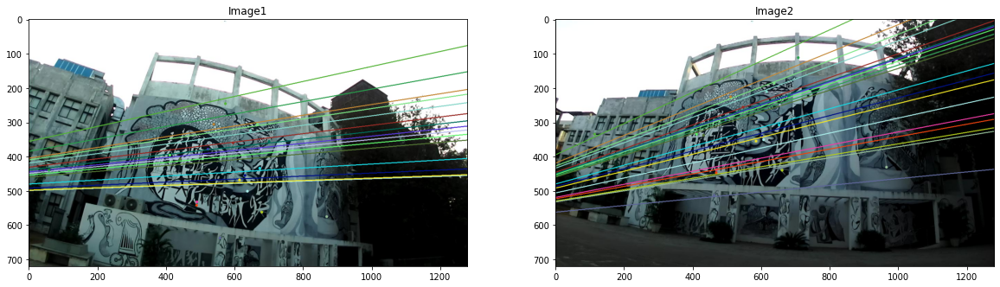

In [51]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_1.jpg') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_2.jpg'),cv2.COLOR_BGR2RGB)

pts1 , pts2 , op = get_feature_points( img1 ,img2 )
img1 , img2 = epi_polar_lines(pts1 ,pts2 , img1 ,img2)

pix , a = plt.subplots(1,2)

a[0].imshow(img1)
a[0].set_title('Image1')

a[1].imshow(img2)
a[1].set_title('Image2')
print()


### 3) Rectification of Stereo Image pair

In [4]:
def rectify_images(image1, image2, x1, x2):
    x1, x2 = rectify(image1, image2)
    F, mask = cv2.findFundamentalMat(x1, x2, cv2.FM_LMEDS)
    x1 = x1[mask.ravel() == 1]
    x2 = x2[mask.ravel() == 1]
    rectFlag, rectM1, rectM2 = cv2.stereoRectifyUncalibrated(x1, x2, F, image1.shape[:2])
    image1 = cv2.warpPerspective(image1, rectM1, tuple([image1.shape[1] , image1.shape[0]]) )
    image2 = cv2.warpPerspective(image2, rectM2, tuple([image2.shape[1] , image2.shape[0]]) )
    return image1, image2

def rectify(img1, img2):
    i1, i2, x1, x2 = rectify_with_sift(img1, img2, False)
    return x1, x2

def rectify_with_sift(image1, image2, flag=True):
    if (image1.shape != image2.shape):
        print("ERROR: Image 1 & 2 must have the same shape!")
        return None
    shape = image1.shape
    (height, width, dim) = shape
    filtered1 = image1 #cv.equalizeHist(image1)
    filtered2 = image2 #cv.equalizeHist(image2)
    # Find keypoints and descriptors with SIFT
    sift = cv2.xfeatures2d.SIFT_create() #cv.SIFT()
    keypoints1, descriptors1 = sift.detectAndCompute(filtered1, mask = None)
    keypoints2, descriptors2 = sift.detectAndCompute(filtered2, mask = None)
    # Match features using FLANN based matching
    FLANN_INDEX_KDTREE = 0
    flann = cv2.FlannBasedMatcher(
        indexParams = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5),
        searchParams = dict(checks = 50))
    matches = flann.knnMatch(descriptors1, descriptors2, k = 2)
    x1 = []
    x2 = []
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.8*n.distance:
            x1.append(keypoints1[m.queryIdx].pt)
            x2.append(keypoints2[m.trainIdx].pt)
    x1 = np.float64(x1)
    x2 = np.float64(x2)
    if flag:
        return rectify_images(image1, image2, x1, x2)
    else:
        return image1, image2, x1, x2

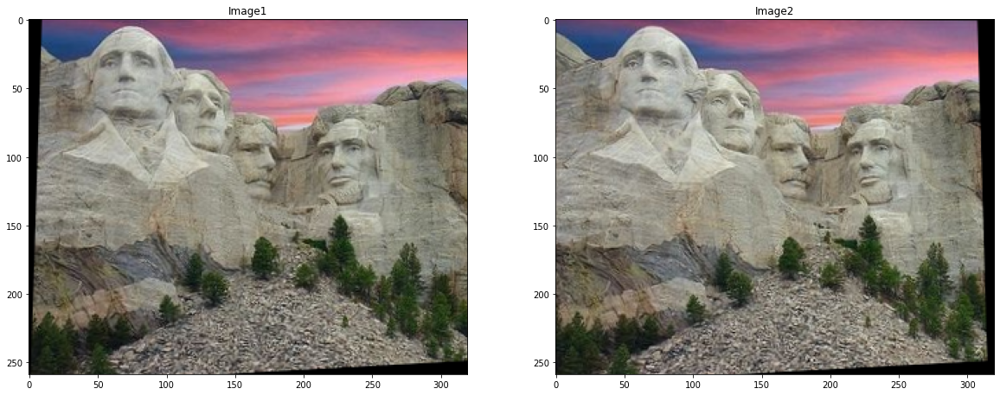

In [18]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op1 ,op2  = rectify_with_sift(img1 ,img2)

pix , a = plt.subplots(1,2)

a[0].imshow(op1)
a[0].set_title('Image1')

a[1].imshow(op2)
a[1].set_title('Image2')
print()

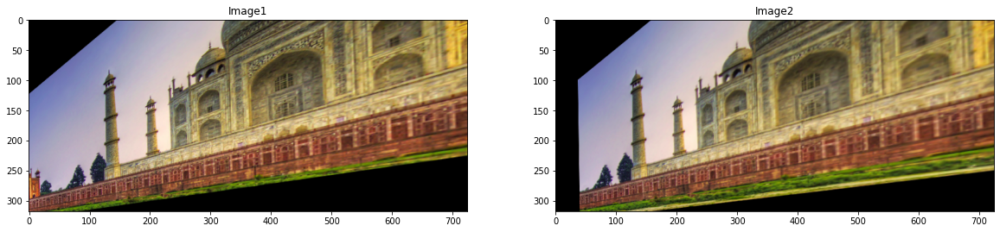

In [20]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_1.png') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_2.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op1 ,op2  = rectify_with_sift(img1 ,img2)

pix , a = plt.subplots(1,2)

a[0].imshow(op1)
a[0].set_title('Image1')

a[1].imshow(op2)
a[1].set_title('Image2')
print()

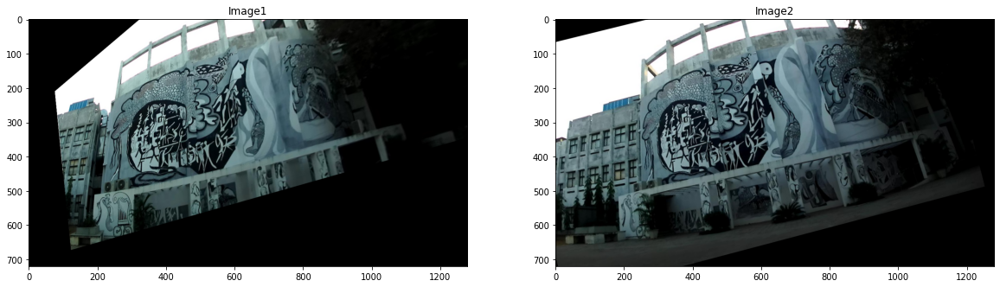

In [22]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_1.jpg') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_2.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op1 ,op2  = rectify_with_sift(img1 ,img2)

pix , a = plt.subplots(1,2)

a[0].imshow(op1)
a[0].set_title('Image1')

a[1].imshow(op2)
a[1].set_title('Image2')
print()

### Greedy Matching 

In [5]:
def greedy_matching(img1, img2, img3 ,window):
    h,w = (img3.shape[:2])
    
    img4 = img3.copy()
    
    for i in range(0, img1.shape[0]-window, window):
        for j in range(0, img1.shape[1]-window, window):
            
            tmp1 = img1[i:i+window, j:j+window]
            cort = 0
            mt = 0
            for k in range(0, img2.shape[1]-window, window):
                tmp2 = img2[i:i+window, k:k+window]
                temp_cor = correlation_coefficient (tmp1, tmp2)
              
                if cort>temp_cor:
                    cor=cort
                    mt = k
            mid1 = (j + window//2, i + window//2)
            mid2 = (mt + window//2+w//2, i + window//2)
            
            cv2.circle(img4,mid1, 5, (255,0,0),-1)
            cv2.circle(img4,mid2, 5, (255,0,0),-1)
            cv2.line(img4, mid1,  mid2, (0, 0, 255), thickness=2, lineType=8)
            
    return img4


def correlation_coefficient(patch1, patch2):
    product = np.mean((patch1 - patch1.mean()) * (patch2 - patch2.mean()))
    stds = patch1.std() * patch2.std()
    if stds == 0:
        return 0
    else:
        product /= stds
        return product

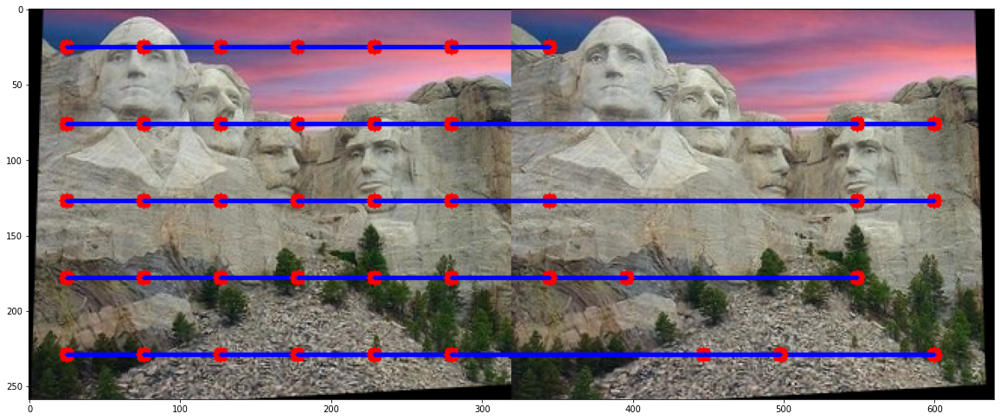

In [7]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_1.jpg') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op1 ,op2  = rectify_with_sift(img1 ,img2)

img3 = np.concatenate((op1 ,op2) ,axis=1)

final = greedy_matching(op1 ,op2 ,img3 ,51)

plt.imshow(final)

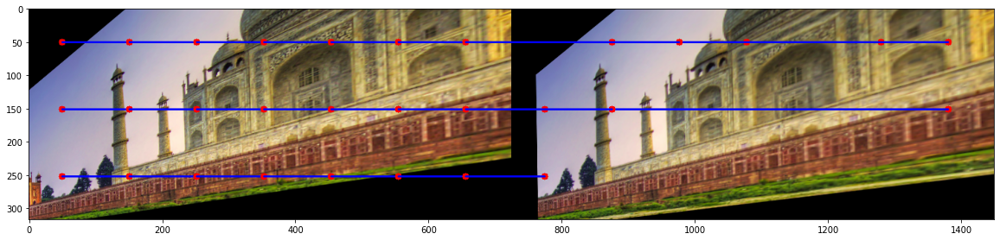

In [9]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_1.png') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/2_2.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op1 ,op2  = rectify_with_sift(img1 ,img2)

img3 = np.concatenate((op1 ,op2) ,axis=1)

final = greedy_matching(op1 ,op2 ,img3 ,101)

plt.imshow(final)

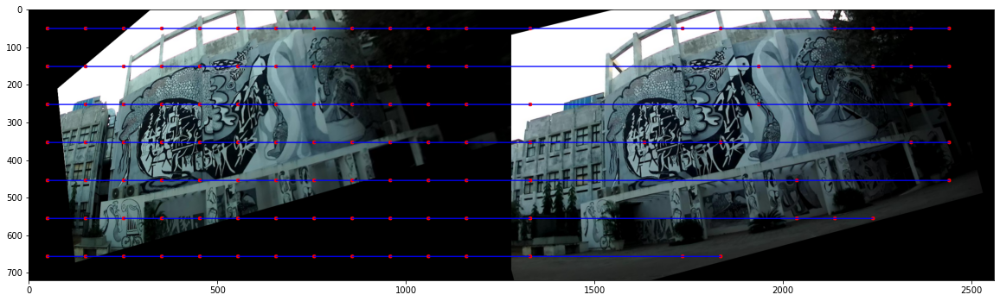

In [10]:
img1 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_1.jpg') ,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/Stereo Correspondence/3_2.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1] ,img1.shape[0]) ) 

op1 ,op2  = rectify_with_sift(img1 ,img2)

img3 = np.concatenate((op1 ,op2) ,axis=1)

final = greedy_matching(op1 ,op2 ,img3 ,101)

plt.imshow(final)

### Observations 

1. Greedy Matching Gives batter matching Compare to the Bruteforce based matching 
2. In Greedy matching Tamplates are matched in same row of images which are rectified so , There are more chances of matching the tamplates with batter accuracy 